# missing column
- 다른 컬럼에서 미싱데이터 채워서 y값과 상관관계 보는 것은 이전 컬럼에서의 상관관계가 이어지기 때문에 크게 의미 없을 수도.. 
- 미싱데이터인 이유가 유의미 한지 보는 것은 미싱 여부 컬럼을 만들어서 y값과 상관관계가 있으면 그 독립변수의 미싱값인 이유가 있는거다!! 채우는게 더 안좋을수도 있다
    - num_room, state : 카테고리로 만들어보기 
    - cafe 관련 column - price  상관관계가 정규분포를 이룬다. 
    - 상관관계가 뚜렷한 column 끼리 regression? -> nan이 적은 column 사용?
    - 

In [3]:
%matplotlib inline

In [124]:
# df_macro = pd.read_csv('./data/macro.csv', parse_dates=['timestamp'])
df_train = pd.read_csv('./data/train.csv', index_col=0, parse_dates=['timestamp'])
df_test = pd.read_csv('./data/test.csv', index_col=0, parse_dates=['timestamp'])

In [1]:
df_train = pd.read_csv('./data/train_macro5.csv', index_col=0, parse_dates=['timestamp'])

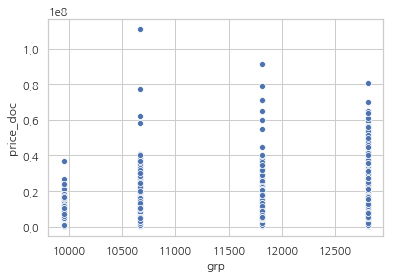

In [4]:
sns.scatterplot(x="grp", y="price_doc", data=df_train)

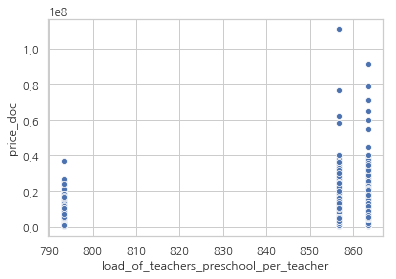

In [8]:
sns.scatterplot(x="load_of_teachers_preschool_per_teacher", y="price_doc", data=df_train)

In [59]:
df_missing = df_train.isnull().sum(axis=0).reset_index()
df_missing.columns = ['column_name', 'missing_count']
df_missing = df_missing.loc[df_missing['missing_count']>0]

In [126]:
df_train['sub_area'].unique()

array(['Bibirevo', 'Nagatinskij Zaton', "Tekstil'shhiki", 'Mitino',
       'Basmannoe', 'Nizhegorodskoe', "Sokol'niki", 'Koptevo', 'Kuncevo',
       'Kosino-Uhtomskoe', 'Zapadnoe Degunino', 'Presnenskoe',
       'Lefortovo', "Mar'ino", "Kuz'minki", 'Nagornoe', "Gol'janovo",
       'Vnukovo', 'Juzhnoe Tushino', 'Severnoe Tushino',
       "Chertanovo Central'noe", 'Fili Davydkovo', 'Otradnoe',
       'Novo-Peredelkino', 'Bogorodskoe', 'Jaroslavskoe', 'Strogino',
       'Hovrino', "Moskvorech'e-Saburovo", 'Staroe Krjukovo', 'Ljublino',
       'Caricyno', 'Veshnjaki', 'Danilovskoe', 'Preobrazhenskoe',
       "Kon'kovo", 'Brateevo', 'Vostochnoe Izmajlovo', 'Vyhino-Zhulebino',
       'Donskoe', 'Novogireevo', 'Juzhnoe Butovo', 'Sokol', 'Kurkino',
       'Izmajlovo', 'Severnoe Medvedkovo', 'Rostokino',
       'Orehovo-Borisovo Severnoe', 'Ochakovo-Matveevskoe', 'Taganskoe',
       'Dmitrovskoe', 'Orehovo-Borisovo Juzhnoe', 'Teplyj Stan',
       'Babushkinskoe', 'Pokrovskoe Streshnevo', 'Obruc

In [107]:
df_missing

,column_name,missing_count
2,life_sq,6383
3,floor,167
4,max_floor,9572
5,material,9572
6,build_year,13605
7,num_room,9572
8,kitch_sq,9572
9,state,13559
17,preschool_quota,6688
20,school_quota,6685


In [60]:
missing_col = list(df_missing['column_name']) 

In [61]:
missing_df = df_train[missing_col].reset_index()

In [62]:
target_df = df_train['price_doc'].to_frame().reset_index()

In [63]:
df = pd.merge(missing_df, target_df, on = 'id' )
df.tail()

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
30466,30469,27.0,7.0,9.0,1.0,1975.0,2.0,6.0,3.0,5088.0,...,1102.56,869.23,647.89,1112.68,880.28,17.24,689.95,1156.08,923.02,7400000
30467,30470,59.0,3.0,9.0,2.0,1935.0,4.0,10.0,3.0,1874.0,...,1321.69,1059.04,895.84,1476.65,1186.24,12.85,887.43,1462.88,1175.16,25000000
30468,30471,NaN,10.0,20.0,1.0,NaN,1.0,1.0,1.0,NaN,...,1285.71,1021.43,700.00,1222.22,961.11,6.96,747.37,1263.16,1005.26,6970959
30469,30472,32.0,5.0,15.0,1.0,2003.0,2.0,11.0,2.0,2372.0,...,1195.31,950.00,681.48,1152.78,917.13,9.33,703.20,1182.65,942.92,13500000
30470,30473,28.0,1.0,9.0,1.0,1968.0,2.0,6.0,2.0,2215.0,...,942.31,740.38,595.65,1054.35,825.00,10.16,664.44,1127.78,896.11,5600000


In [46]:
sns.pairplot(df)

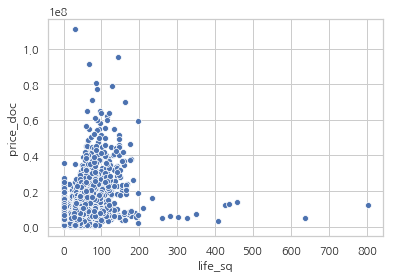

In [70]:
sns.scatterplot(x="life_sq", y="price_doc", data=df)

In [67]:
df.loc[df['life_sq'] > 7000]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
13546,13549,7478.0,8.0,17.0,1.0,2014.0,3.0,1.0,1.0,NaN,...,1500.0,1250.0,1000.0,1500.0,1250.0,4.75,700.0,1125.0,912.5,7705000


In [69]:
df.loc[df['life_sq'] > 7000, 'life_sq'] = np.nan

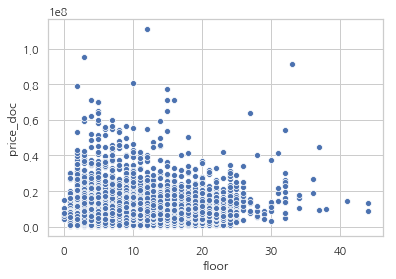

In [74]:
sns.scatterplot(x="floor", y="price_doc", data=df)

In [72]:
df.loc[df['floor'] > 70]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
23584,23587,33.0,77.0,22.0,1.0,1986.0,2.0,10.0,3.0,3091.0,...,1271.84,1019.42,694.21,1165.79,930.0,4.2,750.4,1256.03,1003.22,13700000


In [73]:
df.loc[df['floor'] > 70, 'floor'] = np.nan

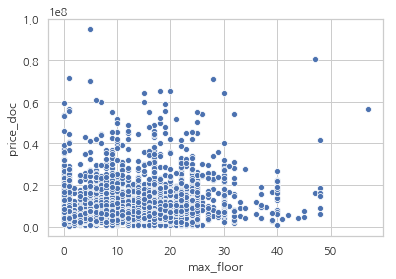

In [79]:
sns.scatterplot(x="max_floor", y="price_doc", data=df)

In [77]:
df.loc[df['max_floor'] > 60]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
20722,20725,47.0,4.0,99.0,2.0,NaN,1.0,1.0,NaN,922.0,...,1428.57,1142.86,825.76,1378.79,1102.27,10.35,733.33,1228.57,980.95,10238400
21734,21737,71.0,5.0,99.0,6.0,NaN,2.0,9.0,NaN,NaN,...,1000.00,750.00,778.57,1285.71,1032.14,14.51,730.77,1230.77,980.77,8484365
21852,21855,46.0,17.0,99.0,6.0,NaN,3.0,9.0,NaN,NaN,...,1000.00,750.00,1750.00,2875.00,2312.50,6.79,1081.25,1750.00,1415.63,6670000
25940,25943,63.0,8.0,117.0,1.0,NaN,2.0,1.0,1.0,1874.0,...,1468.75,1180.19,882.31,1453.00,1167.66,5.73,880.53,1451.32,1165.93,7239838


In [78]:
df.loc[df['max_floor'] > 60, 'max_floor'] = np.nan

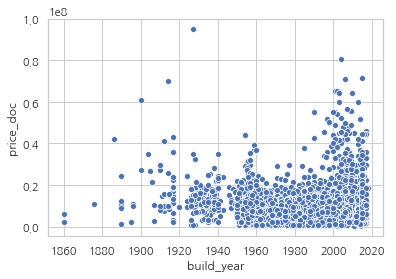

In [90]:
sns.scatterplot(x="build_year", y="price_doc", data=df)

In [84]:
df['build_year'].max()

20052009.0

In [85]:
df.loc[df['build_year'] > 2019]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
10089,10092,16.0,8.0,12.0,1.0,20052009.0,1.0,9.0,33.0,1944.0,...,1281.25,1027.60,761.45,1270.95,1016.20,9.71,766.93,1280.36,1023.64,9000000
15220,15223,24.0,4.0,9.0,2.0,4965.0,2.0,5.0,3.0,643.0,...,1118.06,890.97,693.97,1176.72,935.34,17.85,674.12,1141.18,907.65,8400000


In [86]:
df.loc[df['build_year'] > 2019, 'build_year'] = np.nan

In [88]:
df.loc[df['build_year'] < 1750]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
9441,9444,73.0,5.0,22.0,1.0,0.0,3.0,0.0,NaN,NaN,...,1000.00,825.00,825.00,1375.00,1100.00,2.72,815.38,1384.62,1100.00,5626933
9620,9623,35.0,7.0,12.0,1.0,1.0,2.0,1.0,1.0,1503.0,...,1166.67,933.33,684.09,1147.73,915.91,14.96,715.04,1203.01,959.02,5415070
9700,9703,NaN,24.0,24.0,1.0,1.0,2.0,1.0,1.0,NaN,...,1000.00,825.00,825.00,1375.00,1100.00,2.72,815.38,1384.62,1100.00,5402275
9745,9748,39.0,10.0,17.0,1.0,1.0,1.0,12.0,1.0,2395.0,...,1000.00,825.00,760.00,1300.00,1030.00,6.54,662.50,1156.25,909.38,3984760
9764,9767,NaN,24.0,1.0,1.0,1.0,1.0,1.0,1.0,6839.0,...,1233.33,983.33,732.43,1243.24,987.84,4.80,889.39,1484.85,1187.12,15696466
10122,10125,27.0,5.0,12.0,6.0,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,2.75,1250.00,2000.00,1625.00,2061954
10142,10145,60.0,11.0,0.0,4.0,0.0,2.0,0.0,1.0,2395.0,...,1000.00,825.00,760.00,1300.00,1030.00,6.54,662.50,1156.25,909.38,6518400
10260,10263,NaN,7.0,17.0,1.0,0.0,1.0,0.0,1.0,NaN,...,1000.00,750.00,500.00,1000.00,750.00,4.56,661.54,1153.85,907.69,3713560
10294,10297,37.0,16.0,0.0,1.0,0.0,1.0,0.0,1.0,2395.0,...,1000.00,825.00,760.00,1300.00,1030.00,6.54,662.50,1156.25,909.38,4061390
10329,10332,25.0,3.0,5.0,2.0,1.0,1.0,9.0,2.0,4050.0,...,1446.43,1151.79,852.50,1412.50,1132.50,8.77,913.51,1527.03,1220.27,7000000


In [89]:
df.loc[df['build_year'] < 1750, 'build_year'] = np.nan

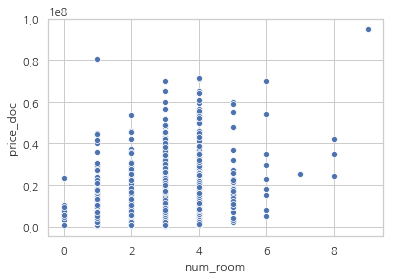

In [98]:
sns.scatterplot(x="num_room", y="price_doc", data=df)

In [96]:
df.loc[df['num_room'] >= 10]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
11621,11624,19.0,17.0,17.0,1.0,2011.0,19.0,7.0,3.0,NaN,...,1000.0,825.00,825.00,1375.00,1100.00,2.32,828.57,1392.86,1110.71,2630000
17764,17767,34.0,1.0,2.0,1.0,1992.0,10.0,10.0,2.0,5278.0,...,875.0,700.00,566.67,916.67,741.67,6.69,540.00,900.00,720.00,6000000
26713,26716,30.0,14.0,17.0,1.0,1984.0,17.0,8.0,3.0,2372.0,...,1303.8,1046.84,715.68,1197.30,956.49,3.45,751.44,1257.18,1004.31,13150000
29172,29175,33.0,20.0,22.0,1.0,2000.0,10.0,10.0,3.0,10175.0,...,1030.3,815.15,626.92,1057.69,842.31,11.45,617.78,1050.00,833.89,11000000


In [97]:
df.loc[df['num_room'] >= 10, 'num_room'] = np.nan

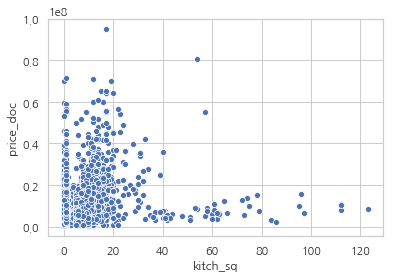

In [102]:
sns.scatterplot(x="kitch_sq", y="price_doc", data=df)

In [100]:
df.loc[df['kitch_sq'] >= 250]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
10368,10371,41.0,5.0,17.0,6.0,2013.0,3.0,2013.0,1.0,NaN,...,1500.00,1250.00,1000.00,1500.00,1250.00,4.75,700.00,1125.00,912.50,7281225
11520,11523,23.0,11.0,14.0,5.0,1971.0,2.0,620.0,2.0,2215.0,...,1068.18,838.64,624.44,1077.78,851.11,6.36,667.47,1132.53,900.00,6300000
13117,13120,19.0,5.0,1.0,1.0,NaN,1.0,1970.0,3.0,1313.0,...,1166.67,931.58,667.78,1127.78,897.78,16.81,688.89,1170.25,929.57,3650000
21415,21418,43.0,3.0,1.0,1.0,2014.0,1.0,2014.0,1.0,NaN,...,1000.00,750.00,1750.00,2875.00,2312.50,8.62,1108.33,1833.33,1470.83,3801200
28734,28737,16.0,2.0,12.0,5.0,1972.0,1.0,1974.0,3.0,2080.0,...,600.00,470.00,522.22,888.89,705.56,6.36,507.14,857.14,682.14,1000000


In [101]:
df.loc[df['kitch_sq'] >= 250, 'kitch_sq'] = np.nan

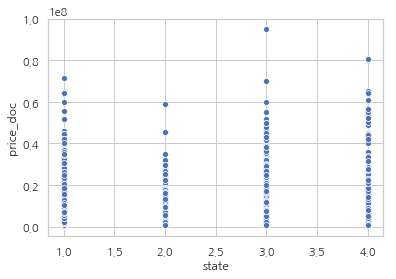

In [106]:
sns.scatterplot(x="state", y="price_doc", data=df)

In [104]:
df.loc[df['state'] > 5]

,id,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,preschool_quota,...,cafe_sum_2000_max_price_avg,cafe_avg_price_2000,cafe_sum_3000_min_price_avg,cafe_sum_3000_max_price_avg,cafe_avg_price_3000,prom_part_5000,cafe_sum_5000_min_price_avg,cafe_sum_5000_max_price_avg,cafe_avg_price_5000,price_doc
10089,10092,16.0,8.0,12.0,1.0,NaN,1.0,9.0,33.0,1944.0,...,1281.25,1027.6,761.45,1270.95,1016.2,9.71,766.93,1280.36,1023.64,9000000


In [105]:
df.loc[df['state'] > 5, 'state'] = 3.0

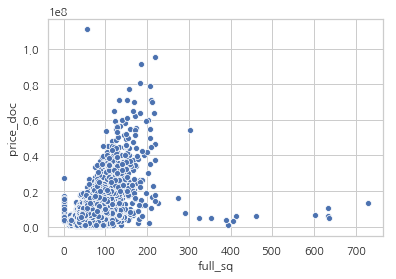

In [111]:
sns.scatterplot(x="full_sq", y="price_doc", data=df_train)

In [109]:
df_train.loc[df_train['full_sq'] > 1000]

,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,state,...,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
id,,,,,,,,,,,,,,,,,,,,,
3530,2012-09-07,5326,22.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,7,2,0,5,16,0,2,43,6,6868818


In [110]:
df_train.loc[df_train['full_sq'] > 1000, 'full_sq'] = np.mean(df_train['full_sq'].dropna())

In [117]:
df_train = df_train.drop([2121]) 

# Replace outliers with proper value #
df_train.loc[df_train.state == 33, 'state'] = 3
df_train.loc[df_train['life_sq'] > 1000,     'life_sq']       = np.mean(df_train['life_sq'].dropna())
df_train.loc[df_train['kitch_sq'] > 250,     'kitch_sq']      = np.mean(df_train['kitch_sq'].dropna())
df_train.loc[df_train['num_room'] > 6,       'num_room']      = np.mean(df_train['num_room'].dropna())
df_train.loc[df_train['build_year'] > 2017,  'build_year']    = np.mean(df_train['build_year'].dropna())
df_train.loc[df_train['build_year'] < 1800,  'build_year']    = np.mean(df_train['build_year'].dropna())
df_train.loc[df_train['floor'] > 50,         'floor']         = np.mean(df_train['floor'].dropna())
df_train.loc[df_train['max_floor'] > 60,     'max_floor']     = np.mean(df_train['max_floor'].dropna())
df_train.loc[df_train.full_sq == 0, 'full_sq'] = 50
df_train = df_train[df_train.price_doc/df_train.full_sq <= 600000]
df_train = df_train[df_train.price_doc/df_train.full_sq >= 10000]

df_test.loc[df_test['life_sq'] > 1000,     'life_sq']       = np.mean(df_test['life_sq'].dropna())
df_test.loc[df_test['kitch_sq'] > 250,     'kitch_sq']      = np.mean(df_test['kitch_sq'].dropna())
df_test.loc[df_test['num_room'] > 6,       'num_room']      = np.mean(df_test['num_room'].dropna())
df_test.loc[df_test['build_year'] > 2017,  'build_year']    = np.mean(df_test['build_year'].dropna())
df_test.loc[df_test['build_year'] < 1800,  'build_year']    = np.mean(df_test['build_year'].dropna())
df_test.loc[df_test['floor'] > 50,         'floor']         = np.mean(df_test['floor'].dropna())
df_test.loc[df_test['max_floor'] > 60,     'max_floor']     = np.mean(df_test['max_floor'].dropna())
df_test.loc[df_test.full_sq == 0, 'full_sq'] = 50

In [118]:
df_train['month'] = df_train.timestamp.dt.month
df_train['dow'] = df_train.timestamp.dt.dayofweek
df_train['rel_floor'] = df_train['floor'] / df_train['max_floor'].astype(float)
df_train['rel_kitch_sq'] = df_train['kitch_sq'] / df_train['full_sq'].astype(float)
df_train.apartment_name=df_train.sub_area + df_train['metro_km_avto'].astype(str)
df_test.apartment_name=df_test.sub_area + df_train['metro_km_avto'].astype(str)

/home/dockeruser/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  """


In [122]:
df_train['room_size'] = df_train['life_sq'] / df_train['num_room'].astype(float)
# df_test['room_size'] = df_test['life_sq'] / df_test['num_room'].astype(float)

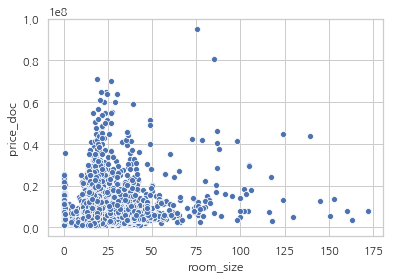

In [123]:
sns.scatterplot(x="room_size", y="price_doc", data=df_train)

In [ ]:
big_church_count_500 : The number of big_church in 500 meters zone
- church_count_500 : The number of church in 500 meters zone 
- mosque_count_500 : The number of mosque in 500 meters zone
- leisure_count_500 : The number of leisure in 500 meters zone
- sport_count_500 : The number of sport in 500 meters zone
- market_count_500 : The number of market in 500 meters zone
- green_part_1000 : The number of green_part in 1000 meters zone
- prom_part_1000 : The share of industrial zones in 100 meters zone
- office_count_1000 : The number of office in 1000 meters zone
- office_sqm_1000 : The square of office space in 1000 meters zone
- trc_count_1000 : The number of shopping malls in 1000 meters zone
- trc_sqm_1000
 big_church_count_1000 : The number of big_church in 1000 meters zone
- church_count_1000 : The number of church in 1000 meters zone
- mosque_count_1000 : The number of mosque in 1000 meters zone
- leisure_count_1000 : The number of leisure in 1000 meters zone
- sport_count_1000 : The number of sport in 1000 meters zone
- market_count_1000 : The number of market in 1000 meters zone
- green_part_1500 : The share of green zones in 1500 meters zone
- prom_part_1500 : The share of industrial zones in 1500 meters zone
- office_count_1500 : The number of office in 1500 meters zone
- office_sqm_1500 : The square of office space in 1500 meters zone
- trc_count_1500 : The number of shopping malls(쇼핑몰) in 1500 meters zone
- trc_sqm_1500
big_church_count_1500 : The number of big_church in 1500 meters zone
- church_count_1500 : The number of church in 1500 meters zone
- mosque_count_1500 : The number of mosque in 1500 meters zone
- leisure_count_1500 : The number of leisure in 1500 meters zone
- sport_count_1500 : The number of sport in 1000 meters zone
- market_count_1500 : The number of market in 1000 meters zone
- green_part_2000 : The share of green zones in 2000 meters zone
- prom_part_2000 : The share of industrial zones in 2000 meters zone
- office_count_2000 : The number of office in 2000 meters zone
- office_sqm_2000 : The square of office space in 2000 meters zone
- trc_count_2000 : The number of shopping malls in 2000 meters zone
- trc_sqm_2000
big_church_count_2000 : The number of big_church in 1000 meters zone
- church_count_2000 : The number of church in 2000 meters zone
- mosque_count_2000 : The number of mosque in 2000 meters zone
- leisure_count_2000 : The number of leisure in 2000 meters zone
- sport_count_2000 : The number of sport in 2000 meters zone
- market_count_2000 : The number of market in 2000 meters zone
- green_part_3000 : The share of green zones in 3000 meters zone
- prom_part_3000 : The share of industrial zones in 3000 meters zone
- office_count_3000 : The number of office in 3000 meters zone
- office_sqm_3000 : The square of office space in 3000 meters zone
- trc_count_3000 : The number of shopping malls in 3000 meters zone
- trc_sqm_3000
big_church_count_3000 : The number of big_church in 3000 meters zone
- church_count_3000 : The number of church in 3000 meters zone
- mosque_count_3000 : The number of mosque in 3000 meters zone
- leisure_count_3000 : The number of leisure in 3000 meters zone
- sport_count_3000 : The number of sport in 3000 meters zone
- market_count_3000 : The number of market in 3000 meters zone
- green_part_5000 : The share of green zones in 5000 meters zone
- prom_part_5000 : The share of industrial zones in 5000 meters zone
- office_count_5000 : The number of office in 5000 meters zone
- office_sqm_5000 : The square of office space in 5000 meters zone
- trc_count_5000 : The number of shopping malls in 5000 meters zone
- trc_sqm_5000
big_church_count_5000 : The number of big_church in 5000 meters zone
- church_count_5000 : The number of church in 5000 meters zone
- mosque_count_5000 : The number of mosque in 5000 meters zone
- leisure_count_5000 : The number of leisure in 5000 meters zone
- sport_count_5000 : The number of sport in 5000 meters zone
- market_count_5000